# Caricamento del dataset
___

In [183]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import statistics
from community import community_louvain
import warnings
warnings.filterwarnings('ignore')

print("Imports ok")

Imports ok


In [184]:
# Caricamento del dataset
dataset = pd.read_csv("~/Desktop/Data_science/Progetto/Python/NetworkX/Dataset networkx/soc-sign-bitcoinotc.csv")
dataset.columns = ['SOURCE', 'TARGET', 'RATING', 'TIME']
dataset.head(35591)

,SOURCE,TARGET,RATING,TIME
0,6,5,2,1.289242e+09
1,1,15,1,1.289243e+09
2,4,3,7,1.289245e+09
3,13,16,8,1.289254e+09
4,13,10,8,1.289254e+09
...,...,...,...,...
35586,4499,1810,1,1.453612e+09
35587,2731,3901,5,1.453679e+09
35588,2731,4897,5,1.453679e+09
35589,13,1128,1,1.453680e+09


# Definizione funzioni
___

In [185]:
def draw(G, pos, measures, measure_name):
    
    nodes = nx.draw_networkx_nodes(G, pos, node_size=100, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys())
    nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1))
    
    edges = nx.draw_networkx_edges(G, pos)

    plt.title(measure_name, fontsize = 20)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()

def get_keys_from_value(d, val):
    
    return [k for k, v in d.items() if v == val]

def community_layout(g, partition):
    
    pos_communities = _position_communities(g, partition, scale=3.)
    pos_nodes = _position_nodes(g, partition, scale=1.)
    pos = dict()
    for node in g.nodes():
        pos[node] = pos_communities[node] + pos_nodes[node]

    return pos

def _position_communities(g, partition, **kwargs):

    between_community_edges = _find_between_community_edges(g, partition)
    communities = set(partition.values())
    hypergraph = nx.DiGraph()
    hypergraph.add_nodes_from(communities)
    for (ci, cj), edges in between_community_edges.items():
        hypergraph.add_edge(ci, cj, weight=len(edges))
    pos_communities = nx.spring_layout(hypergraph, **kwargs)
    pos = dict()
    for node, community in partition.items():
        pos[node] = pos_communities[community]

    return pos

def _find_between_community_edges(g, partition):

    edges = dict()
    for (ni, nj) in g.edges():
        ci = partition[ni]
        cj = partition[nj]
        if ci != cj:
            try:
                edges[(ci, cj)] += [(ni, nj)]
            except KeyError:
                edges[(ci, cj)] = [(ni, nj)]

    return edges

def _position_nodes(g, partition, **kwargs):
    
    communities = dict()
    for node, community in partition.items():
        try:
            communities[community] += [node]
        except KeyError:
            communities[community] = [node]
    pos = dict()
    for ci, nodes in communities.items():
        subgraph = g.subgraph(nodes)
        pos_subgraph = nx.spring_layout(subgraph, **kwargs)
        pos.update(pos_subgraph)

    return pos

# Creazione grafo
___

In [186]:
# Creazione grafo
edges = []
for i in range(0, len(dataset)):
    edges.append((int(dataset.iloc[i, 0]), int(dataset.iloc[i, 1])))
graph = nx.Graph()
graph.add_edges_from(edges)

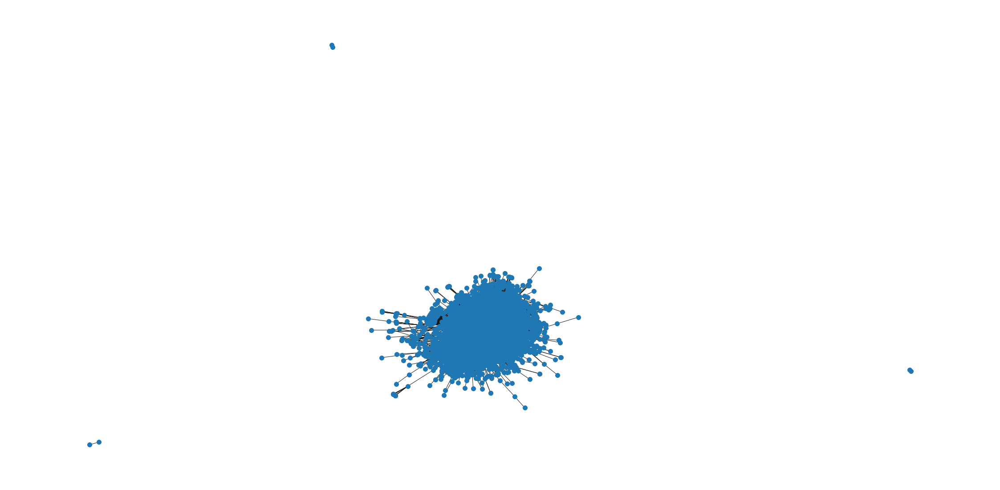

In [187]:
# Plot del grafo con spring layout
plt.figure(figsize=(40,20))
pos = nx.spring_layout(graph)
nx.draw_networkx(graph, pos, with_labels=False, node_size=100)
plt.axis('off')
plt.show()

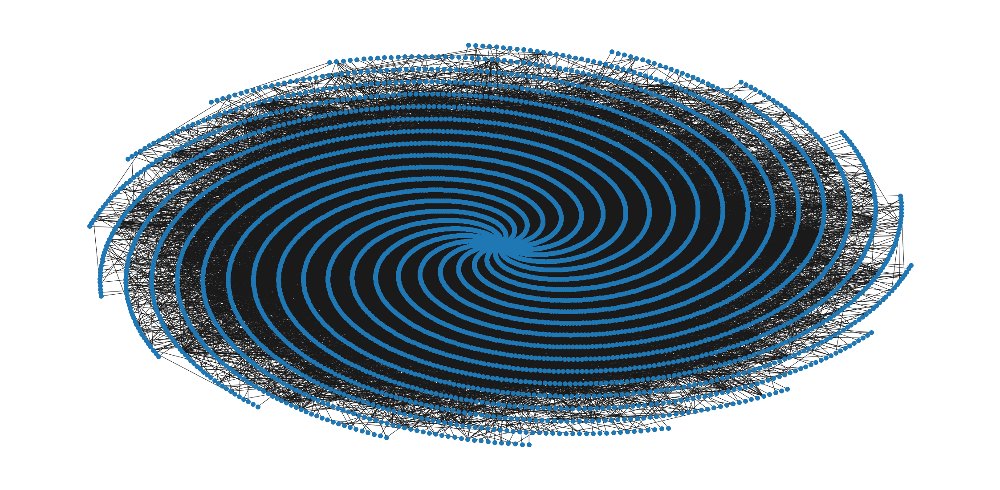

In [188]:
# Plot del grafo con spiral layout
plt.figure(figsize=(40,20))
pos = nx.spiral_layout(graph)
nx.draw_networkx(graph, pos, with_labels=False, node_size=100)
plt.axis('off')
plt.show()

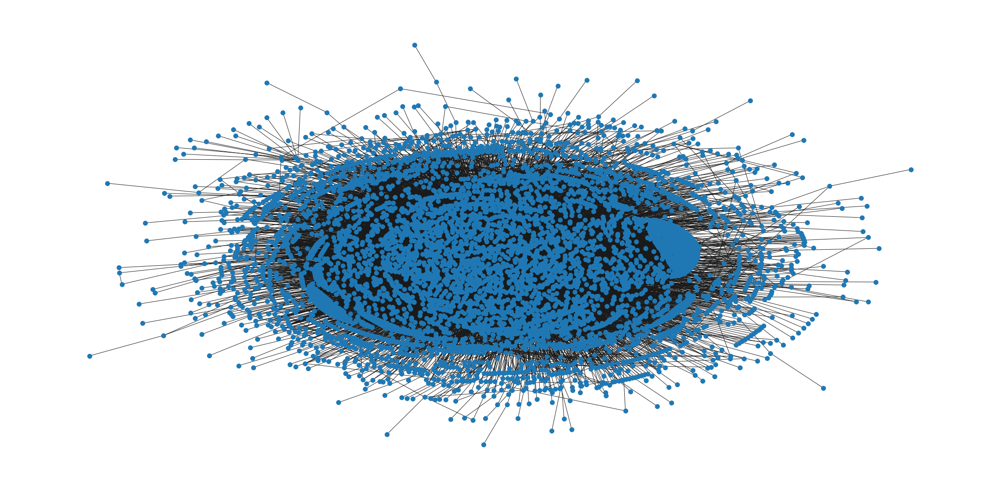

In [189]:
# Plot del grafo con kamada kawai layout
plt.figure(figsize=(40,20))
pos = nx.kamada_kawai_layout(graph)
nx.draw_networkx(graph, pos, with_labels=False, node_size=100)
plt.axis('off')
plt.show()

In [190]:
# Caratteritìstiche del grafo
print("Nodi: ", len(graph.nodes))
print("Archi: ", len(graph.edges))
print("Clustering: ", nx.average_clustering(graph))
print("È connesso: ", nx.is_connected(graph))
print("Componenti connesse: ", nx.number_connected_components(graph))

Nodi:  5881
Archi:  21492
Clustering:  0.17750449405289517
È connesso:  False
Componenti connesse:  4


# Creazione sottografi connessi
___

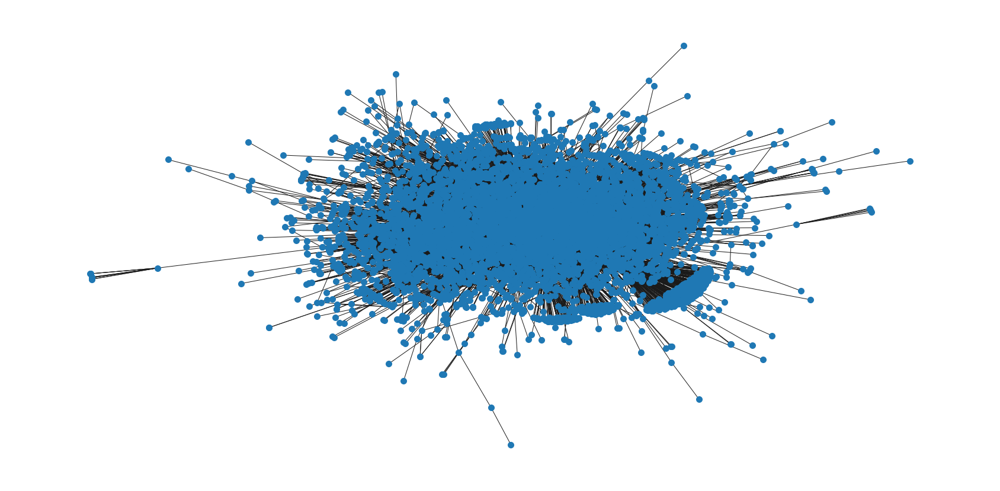

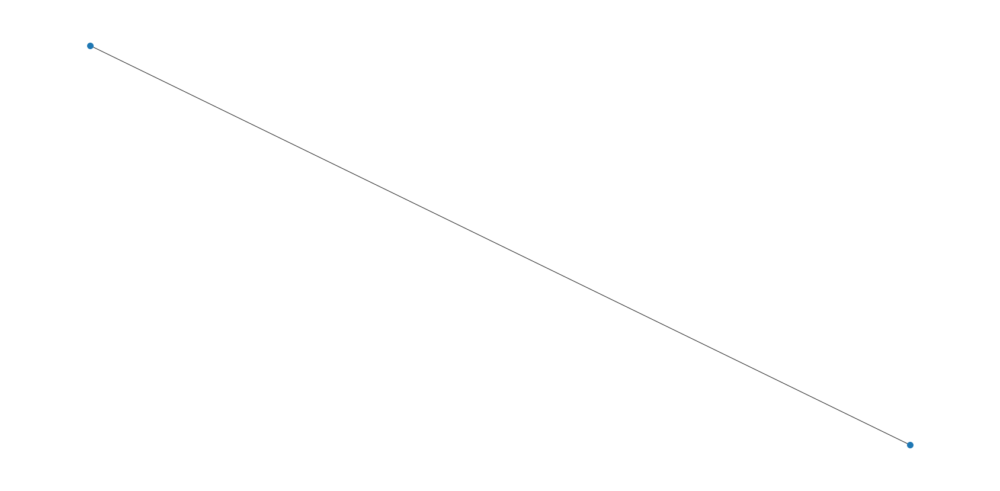

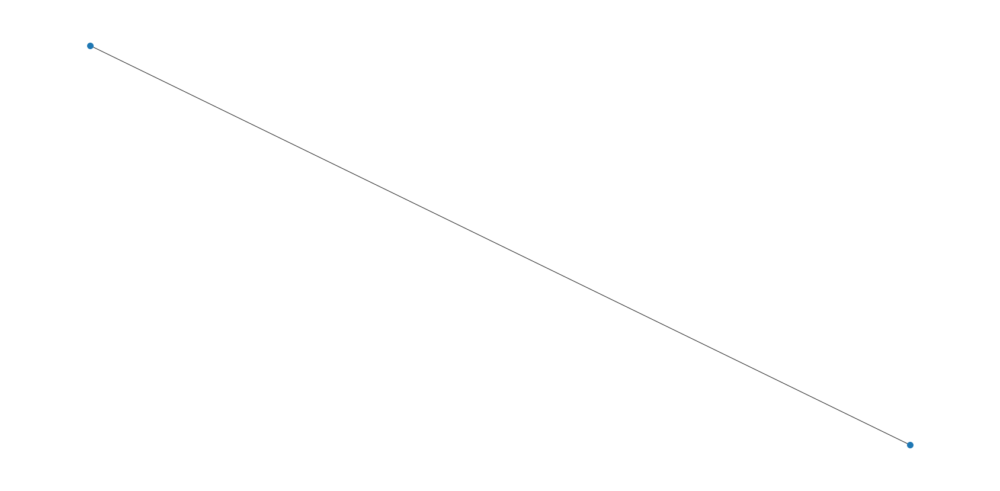

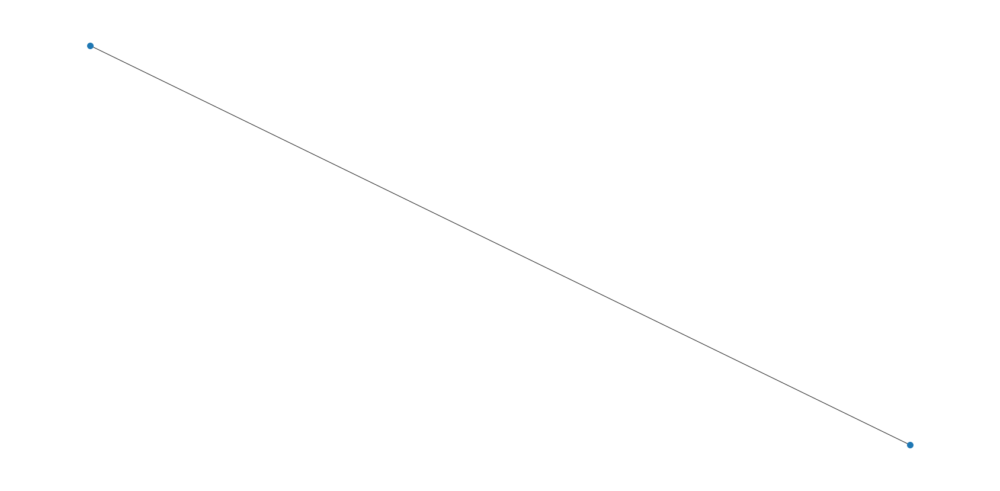

In [191]:
# Creazione sottografi connessi e plot con spring layout
S = [graph.subgraph(c).copy() for c in nx.connected_components(graph)]
for i in range(0, len(S)):
    plt.figure(figsize=(30,15))
    pos = nx.spring_layout(S[i])
    nx.draw_networkx(S[i], pos, with_labels=False, node_size=100)
    plt.axis('off')
    plt.show()

In [192]:
# Caratteristiche componente connessa più grande
nodes = list(S[0].nodes)
print("Nodi: ", len(S[0].nodes))
print("Archi: ", len(S[0].edges))
print("Clustering: ", nx.average_clustering(S[0]))
print("Diametro: ", nx.diameter(S[0]))
print("Raggio: ", nx.radius(S[0]))
print("Lunghezza della periferia: ", len(list(nx.periphery(S[0]))))
print("Lunghezza del centro: ", len(list(nx.center(S[0]))))

Nodi:  5875
Archi:  21489
Clustering:  0.17768577523831092
Diametro:  9
Raggio:  5
Lunghezza della periferia:  16
Lunghezza del centro:  16


# Plot delle centralità
___

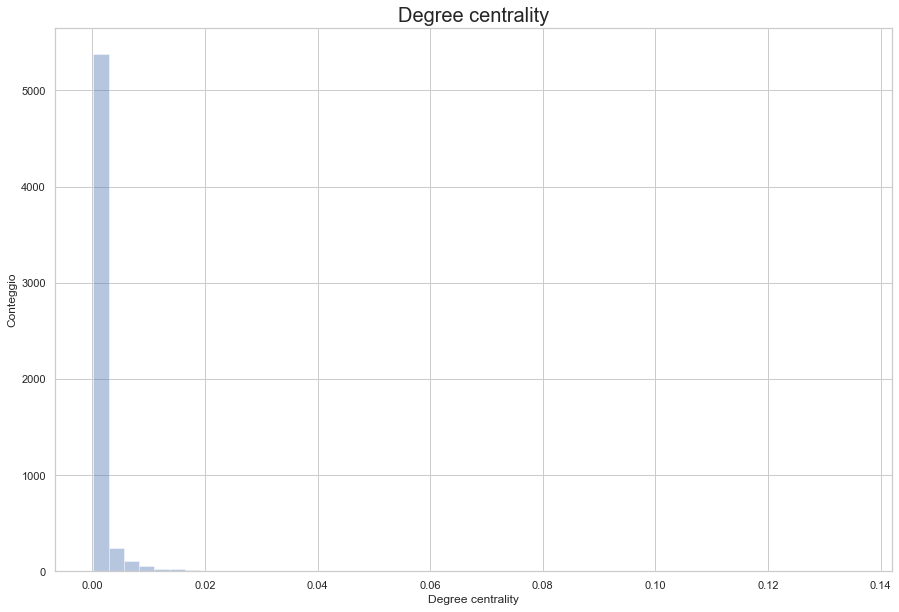

In [193]:
# Degree centrality componente connessa più grande
sns.set(style = 'whitegrid')

degree = nx.degree_centrality(S[0])
plt.figure(figsize=(15,10))
sns.distplot(list(degree.values()), kde=False)
plt.title('Degree centrality', fontsize = 20)
plt.xlabel('Degree centrality')
plt.ylabel('Conteggio')
plt.show()

degree_values = list(dict.fromkeys(list(degree.values())))
degree_keys = []
for i in range (0, len(degree_values)):
    degree_keys.append(get_keys_from_value(degree, degree_values[i]))
count_degree_keys = []
for i in range(0, len(degree_keys)):
    count_degree_keys.append(len(degree_keys[i]))
best_5_index = []
for j in range (0,5):
    max_index = 0
    max_ = 0
    for i in range(0, len(count_degree_keys)):
        if (count_degree_keys[i] > max_):
            max_index = i
            max_ = count_degree_keys[i]
    best_5_index.append(max_index)
    count_degree_keys[max_index] = 0
top_5_degree_nodes = []
for i in range(0,len(best_5_index)):
    top_5_degree_nodes.append(degree_keys[best_5_index[i]])

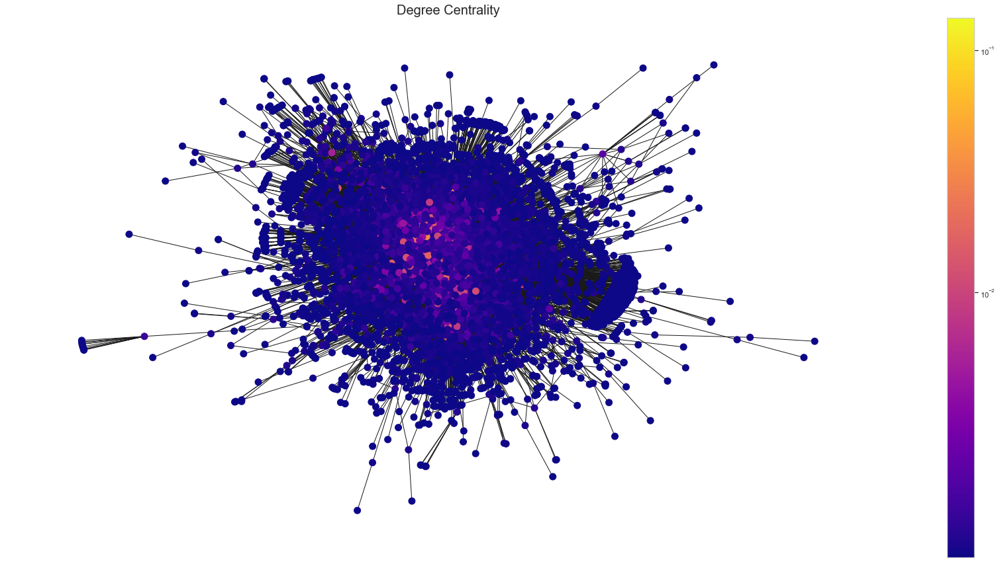

In [194]:
# Plot degree centrality con spring layout
plt.figure(figsize=(30,15))
pos = nx.spring_layout(S[0])
draw(S[0], pos, degree, 'Degree Centrality')

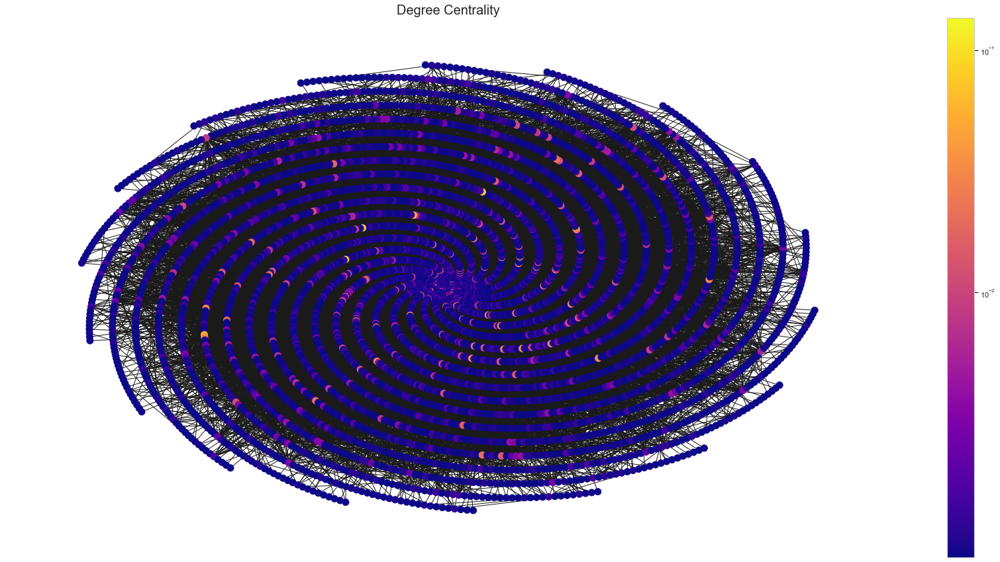

In [195]:
# Plot degree centrality con spiral layout
plt.figure(figsize=(30,15))
pos = nx.spiral_layout(S[0])
draw(S[0], pos, degree, 'Degree Centrality')

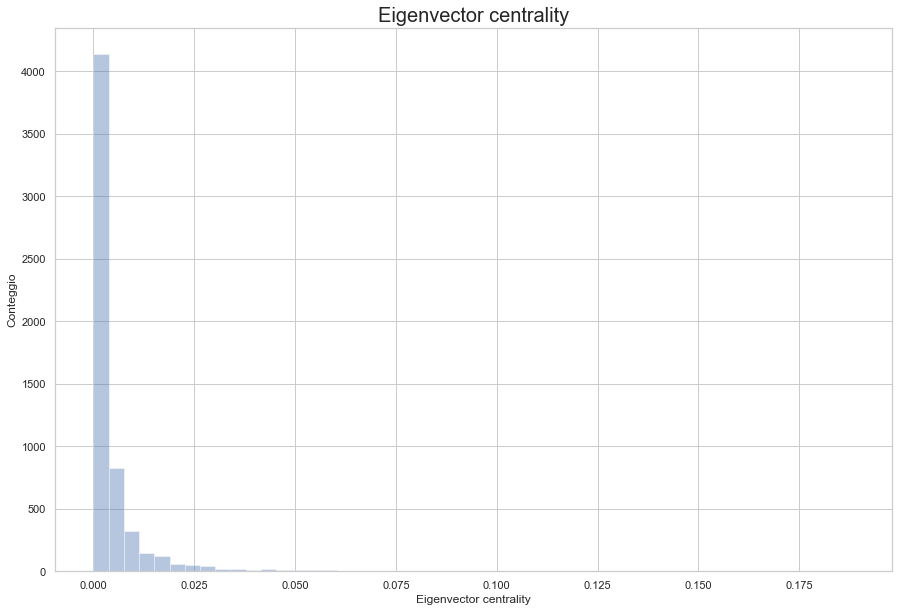

In [196]:
# Eigenvector centrality componente connessa più grande
sns.set(style = 'whitegrid')

eigen = nx.eigenvector_centrality(S[0])
plt.figure(figsize=(15,10))
sns.distplot(list(eigen.values()), kde=False)
plt.title('Eigenvector centrality', fontsize = 20)
plt.xlabel('Eigenvector centrality')
plt.ylabel('Conteggio')
plt.show()

eigen_values = list(dict.fromkeys(list(eigen.values())))
eigen_keys = []
for i in range (0, len(eigen_values)):
    eigen_keys.append(get_keys_from_value(eigen, eigen_values[i]))
count_eigen_keys = []
for i in range(0, len(eigen_keys)):
    count_eigen_keys.append(len(eigen_keys[i]))
best_5_index = []
for j in range (0,5):
    max_index = 0
    max_ = 0
    for i in range(0, len(count_eigen_keys)):
        if (count_eigen_keys[i] > max_):
            max_index = i
            max_ = count_eigen_keys[i]
    best_5_index.append(max_index)
    count_eigen_keys[max_index] = 0
top_5_eigen_nodes = []
for i in range(0,len(best_5_index)):
    top_5_eigen_nodes.append(eigen_keys[best_5_index[i]])

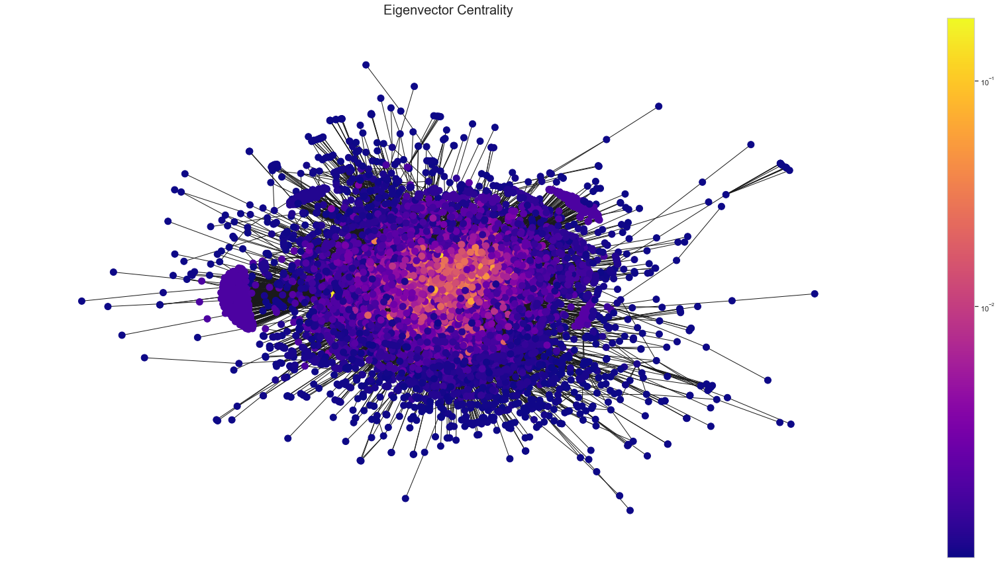

In [197]:
# Plot eigenvector centrality con spring layout
plt.figure(figsize=(30,15))
pos = nx.spring_layout(S[0])
draw(S[0], pos, eigen, 'Eigenvector Centrality')

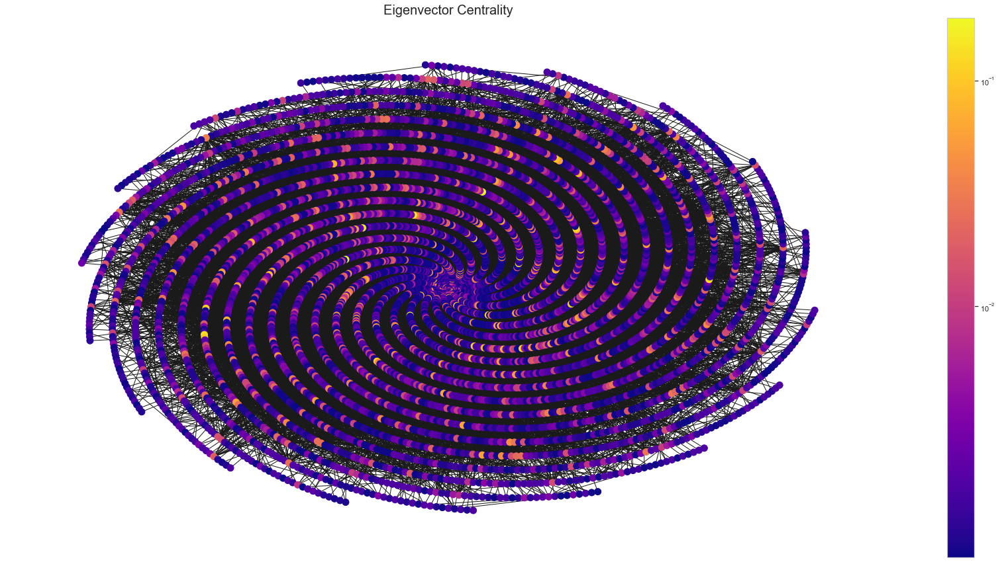

In [198]:
# Plot eigenvector centrality con spiral layout
plt.figure(figsize=(30,15))
pos = nx.spiral_layout(S[0])
draw(S[0], pos, eigen, 'Eigenvector Centrality')

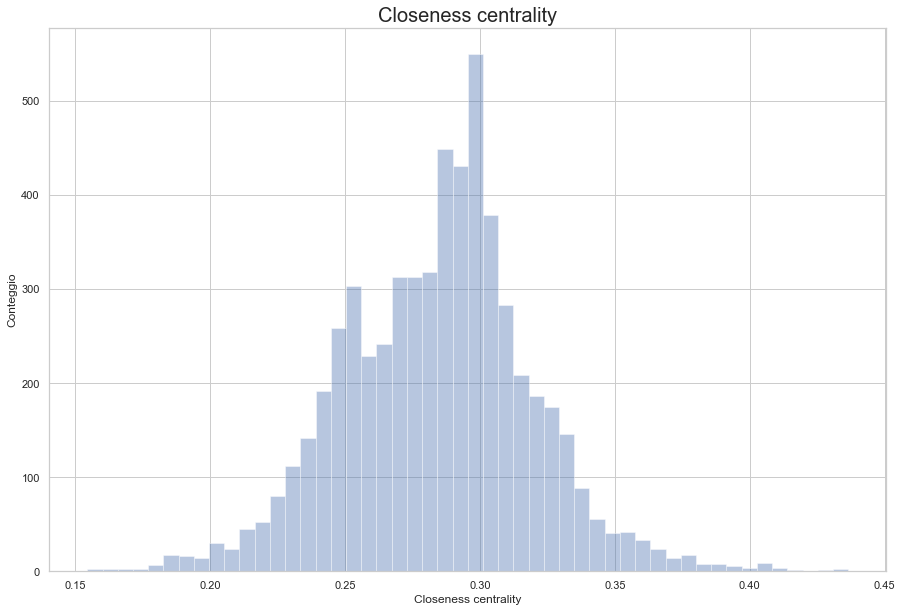

In [199]:
# Closeness centrality componente connessa più grande
sns.set(style = 'whitegrid')

clos = nx.closeness_centrality(S[0])
plt.figure(figsize=(15,10))
sns.distplot(list(clos.values()), kde=False)
plt.title('Closeness centrality', fontsize = 20)
plt.xlabel('Closeness centrality')
plt.ylabel('Conteggio')
plt.show()

clos_values = list(dict.fromkeys(list(clos.values())))
clos_keys = []
for i in range (0, len(clos_values)):
    clos_keys.append(get_keys_from_value(clos, clos_values[i]))
count_clos_keys = []
for i in range(0, len(clos_keys)):
    count_clos_keys.append(len(clos_keys[i]))
best_5_index = []
for j in range (0,5):
    max_index = 0
    max_ = 0
    for i in range(0, len(count_clos_keys)):
        if (count_clos_keys[i] > max_):
            max_index = i
            max_ = count_clos_keys[i]
    best_5_index.append(max_index)
    count_clos_keys[max_index] = 0
top_5_clos_nodes = []
for i in range(0,len(best_5_index)):
    top_5_clos_nodes.append(clos_keys[best_5_index[i]])

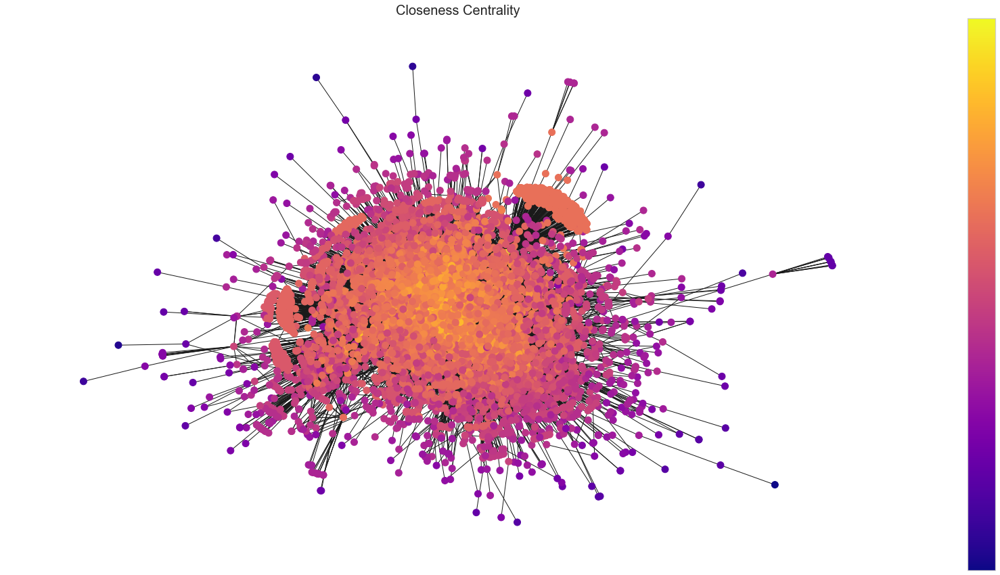

In [200]:
# Plot closeness centrality con spring layout
plt.figure(figsize=(30,15))
pos = nx.spring_layout(S[0])
draw(S[0], pos, clos, 'Closeness Centrality')

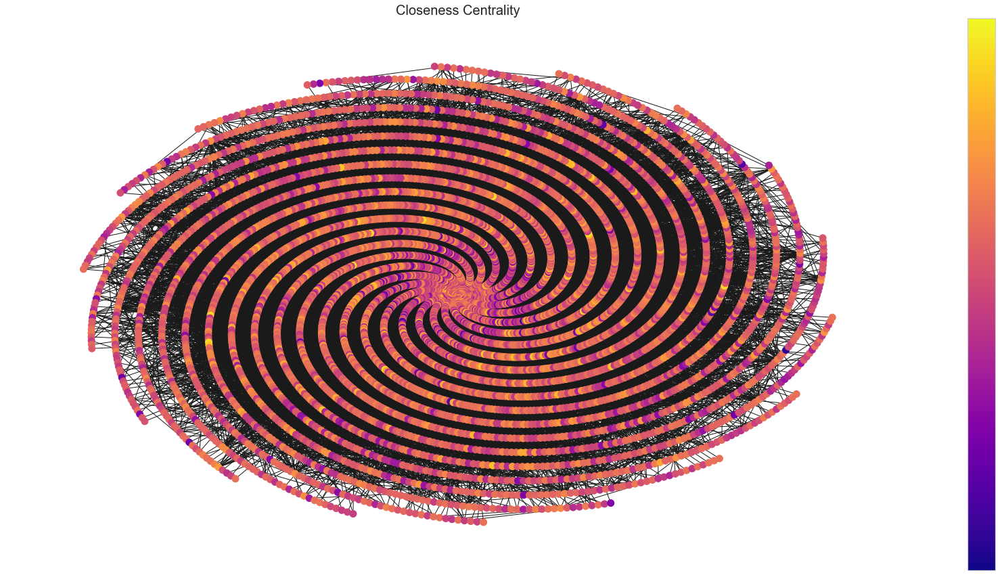

In [201]:
# Plot closeness centrality con spiral layout
plt.figure(figsize=(30,15))
pos = nx.spiral_layout(S[0])
draw(S[0], pos, clos, 'Closeness Centrality')

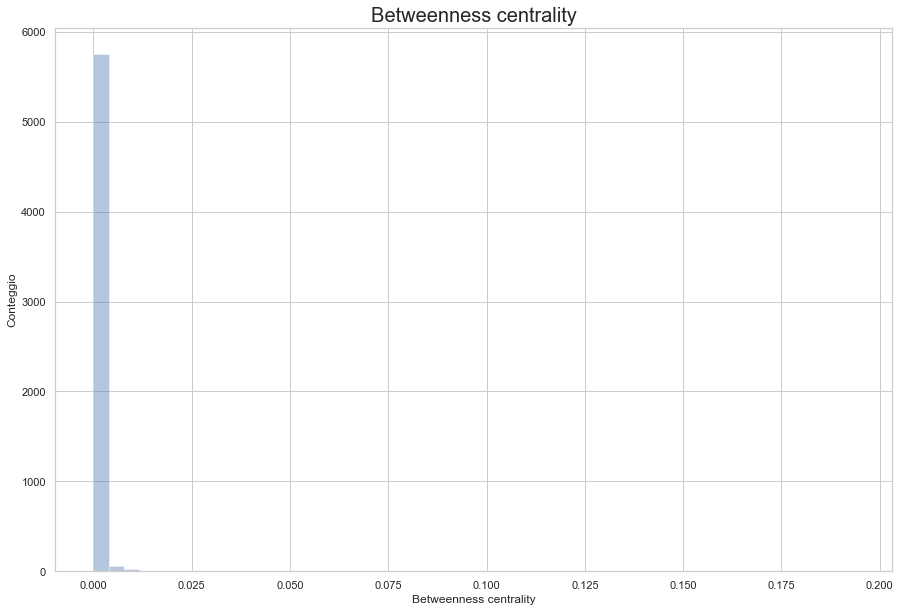

In [202]:
# Betweenness centrality componente connessa più grande
sns.set(style = 'whitegrid')

bet = nx.betweenness_centrality(S[0])
plt.figure(figsize=(15,10))
sns.distplot(list(bet.values()), kde=False)
plt.title('Betweenness centrality', fontsize = 20)
plt.xlabel('Betweenness centrality')
plt.ylabel('Conteggio')
plt.show()

bet_values = list(dict.fromkeys(list(bet.values())))
bet_keys = []
for i in range (0, len(bet_values)):
    bet_keys.append(get_keys_from_value(bet, bet_values[i]))
count_bet_keys = []
for i in range(0, len(bet_keys)):
    count_bet_keys.append(len(bet_keys[i]))
best_5_index = []
for j in range (0,5):
    max_index = 0
    max_ = 0
    for i in range(0, len(count_bet_keys)):
        if (count_bet_keys[i] > max_):
            max_index = i
            max_ = count_bet_keys[i]
    best_5_index.append(max_index)
    count_bet_keys[max_index] = 0
top_5_bet_nodes = []
for i in range(0,len(best_5_index)):
    top_5_bet_nodes.append(bet_keys[best_5_index[i]])

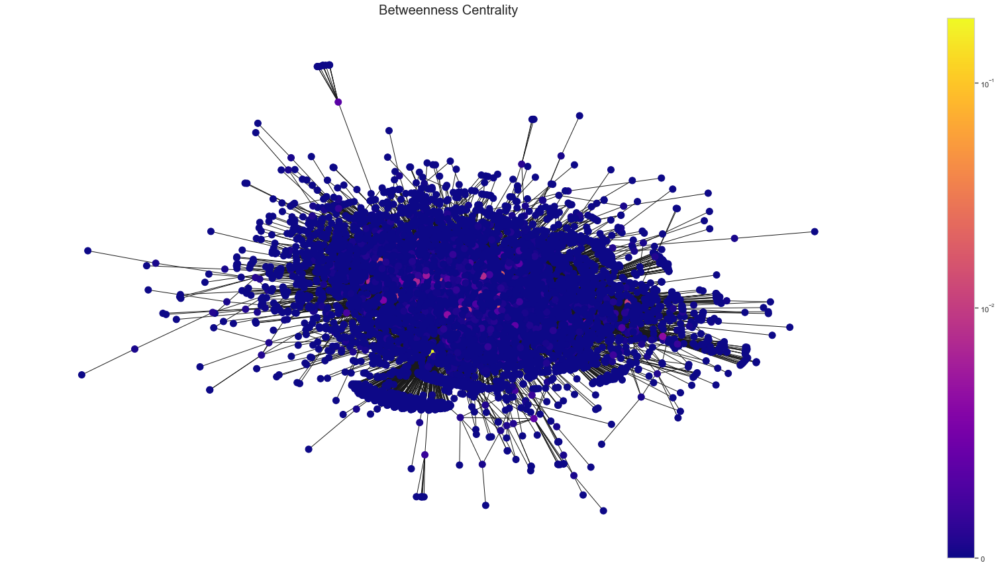

In [203]:
# Plot betweenness centrality con spring layout
plt.figure(figsize=(30,15))
pos = nx.spring_layout(S[0])
draw(S[0], pos, bet, 'Betweenness Centrality')

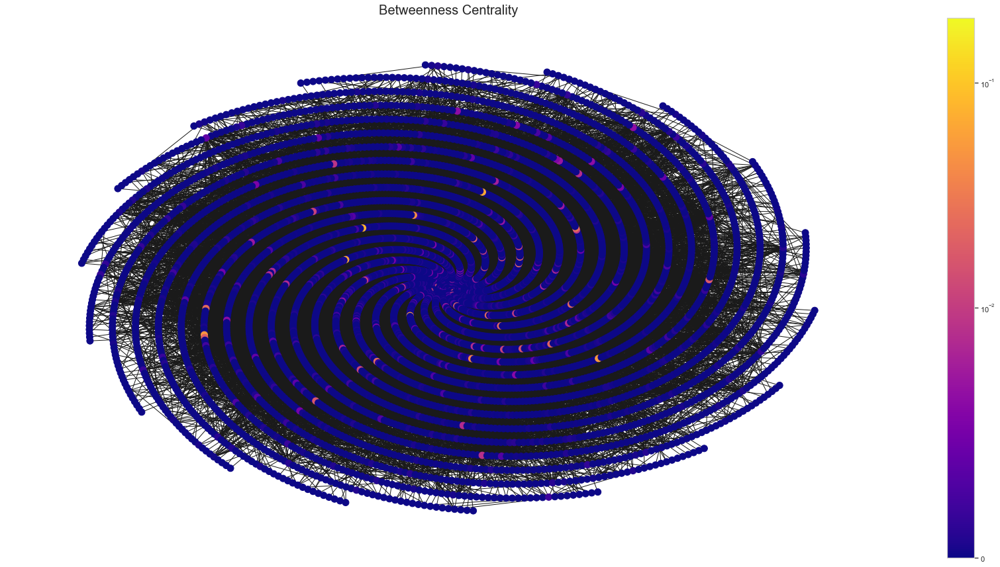

In [204]:
# Plot betweenness centrality con spiral layout
plt.figure(figsize=(30,15))
pos = nx.spiral_layout(S[0])
draw(S[0], pos, bet, 'Betweenness Centrality')

# Nodi nella top 5 centralità
___

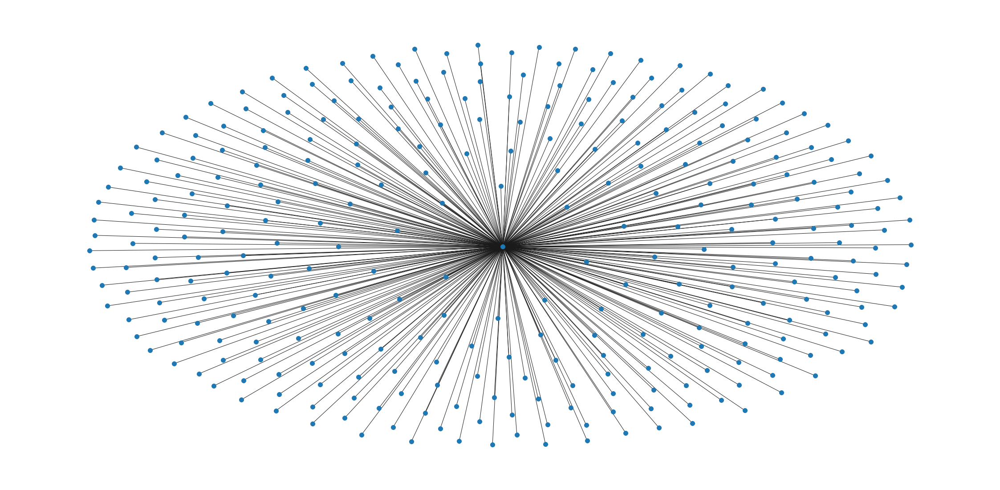

In [205]:
# Creazione grafo dei nodi nelle top 5 centralità e plot con spring layout
top_5_centralities_nodes = []
for i in range(0, len(nodes)):
    found = ((nodes[i] in top_5_degree_nodes[0] and (nodes[i] in top_5_eigen_nodes[0]) and (nodes[i] in top_5_clos_nodes[0]) and (nodes[i] in top_5_bet_nodes[0])))
    if (found == True):   
        top_5_centralities_nodes.append(nodes[i])
edges_nod = []
for i in range(0, len(dataset)):
    if ((int(dataset.iloc[i, 0] in top_5_centralities_nodes) or (int(dataset.iloc[i, 1]) in top_5_centralities_nodes))):
        edges_nod.append((int(dataset.iloc[i, 0]), int(dataset.iloc[i, 1])))
graph_nod = nx.Graph()
graph_nod.add_edges_from(edges_nod)

plt.figure(figsize=(40,20))
pos = nx.spring_layout(graph_nod)
nx.draw_networkx(graph_nod, pos, with_labels=False, node_size=100)
plt.axis('off')
plt.show()

In [206]:
# Nodo centrale del sottografo
top_nodes = list(graph_nod.nodes)
for i in range(0, len(top_nodes)):
    if not(top_nodes[i] in top_5_centralities_nodes):
        centr_node = top_nodes[i]
print(centr_node)

35


In [207]:
# Dataframe sottografo nodi con centralità più alta
data_top_nodes = []
for i in range(0,len(dataset)):
    if ((dataset.iloc[i,0] == 35) or (dataset.iloc[i,1] == 35)):
        data_top_nodes.append(list(dataset.iloc[i,0:3]))
for i in range(0,len(data_top_nodes)):
    for j in range(0,len(data_top_nodes[0])):
        data_top_nodes[i][j] = int(data_top_nodes[i][j])
dataframe_top_nodes = pd.DataFrame.from_records(data_top_nodes)
dataframe_top_nodes.columns = ['SOURCE', 'TARGET', 'RATING']
dataframe_top_nodes.head(1298)

,SOURCE,TARGET,RATING
0,35,6,2
1,35,1,1
2,35,65,1
3,65,35,2
4,35,69,1
...,...,...,...
1293,35,5998,1
1294,35,3992,2
1295,35,5993,-10
1296,35,6004,1


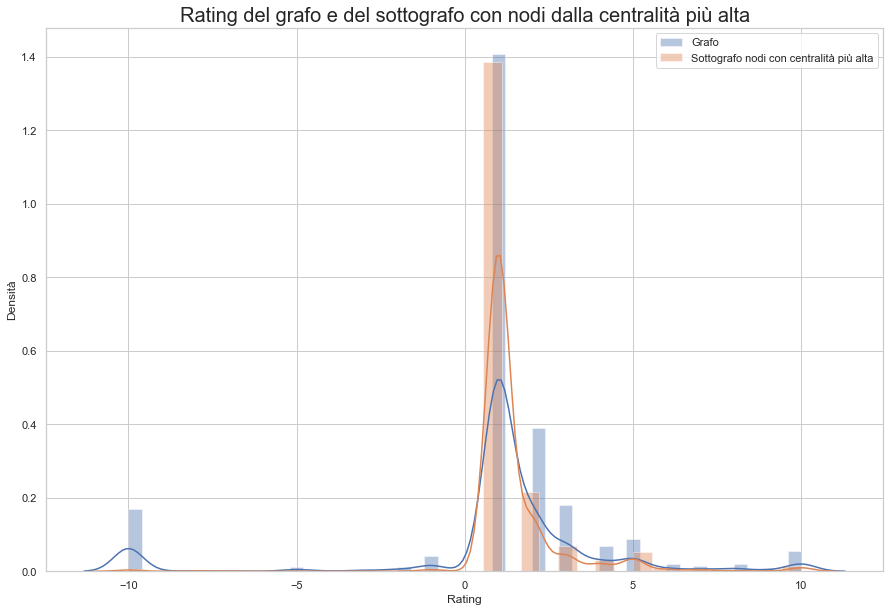

In [208]:
# Distplot ratings nodi con centralità più alta
index_1 = dataset.index
dataframe_dict = {index_1[0]: dataset.iloc[0,2]}
for i in range (1,len(dataset)):
    dictionary_1 = {index_1[i]: dataset.iloc[i,2]}
    dataframe_dict.update(dictionary_1)
    
index_2 = dataframe_top_nodes.index
dataframe_top_nodes_dict = {index_2[0]: dataframe_top_nodes.iloc[0,2]}
for i in range (1,len(dataframe_top_nodes)):
    dictionary_2 = {index_2[i]: dataframe_top_nodes.iloc[i,2]}
    dataframe_top_nodes_dict.update(dictionary_2)

sns.set(style = 'whitegrid')

plt.figure(figsize=(15,10))
sns.distplot(list(dataframe_dict.values()), kde=True, label="Grafo")
sns.distplot(list(dataframe_top_nodes_dict.values()), kde=True, label="Sottografo nodi con centralità più alta")
plt.title('Rating del grafo e del sottografo con nodi dalla centralità più alta', fontsize = 20)
plt.xlabel('Rating')
plt.ylabel('Densità')
plt.legend(loc="upper right")
plt.show()

# Communities
___

In [209]:
# Divisione in communities
g = S[0]
communities = community_louvain.best_partition(g, random_state=42)
sorted_part = dict(sorted(communities.items(), key=lambda item: item[1]))
res = {}
for i, v in sorted_part.items():
    res[v] = [i] if v not in res.keys() else res[v] + [i]
communities_list = []
for i in range(0, len(res)):
    communities_list.append(res[i])
communities_list.sort(key=len, reverse = True)
for i in range(0,int(len(communities_list))):
    print(len(communities_list[i]))

1177
1103
856
694
561
499
406
291
198
40
19
11
6
4
4
3
3


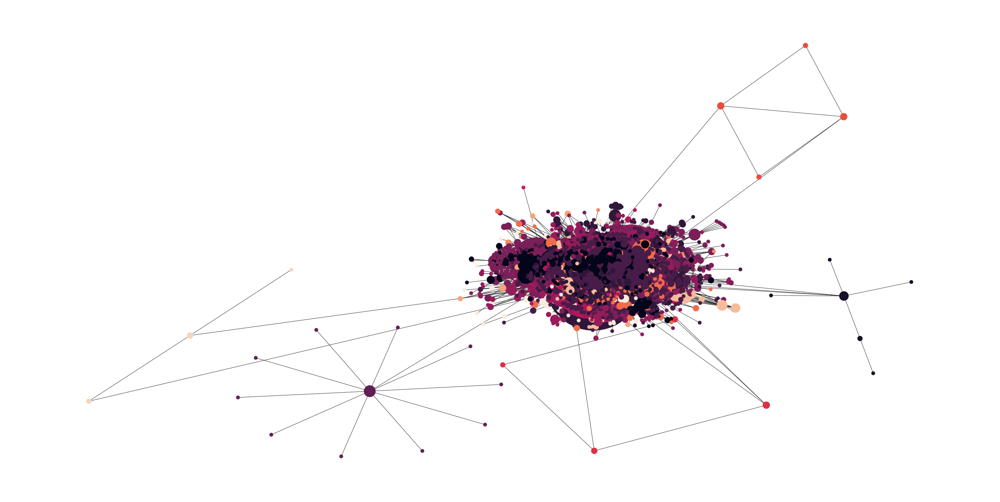

In [210]:
# Plot delle communities
plt.figure(figsize=(40,20))
pos = community_layout(g, communities)
d = dict(S[0].degree)
nx.draw(g, pos, node_color=list(communities.values()),node_size=[v * 100 for v in d.values()])
plt.show()

In [211]:
# Community più numerosa
data_communities = []
for i in range(0,len(dataset)):
    if ((dataset.iloc[i,0] in res[0]) and (dataset.iloc[i,1] in res[0])):
        data_communities.append(list(dataset.iloc[i,0:3]))
for i in range(0,len(data_communities)):
    for j in range(0,len(data_communities[0])):
        data_communities[i][j] = int(data_communities[i][j])
dataframe_communities = pd.DataFrame.from_records(data_communities)
dataframe_communities.columns = ['SOURCE', 'TARGET', 'RATING']
dataframe_communities.head(1419)

,SOURCE,TARGET,RATING
0,359,504,1
1,359,524,1
2,524,359,1
3,597,719,1
4,719,597,1
...,...,...,...
1414,5999,3878,8
1415,5510,1352,-10
1416,5811,6003,1
1417,5318,5688,1


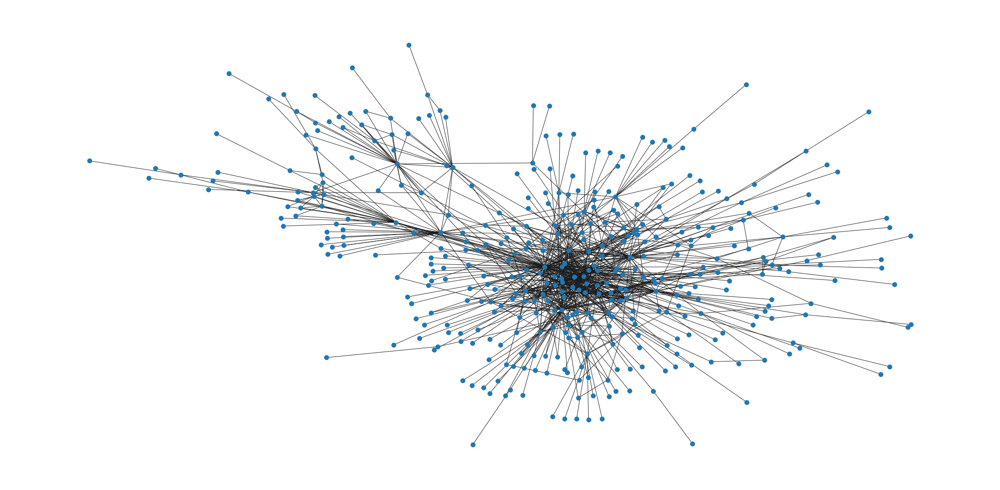

In [212]:
# Plot della community più numerosa con spring layout
community_edges = []
for i in range(0, len(dataframe_communities)):
    community_edges.append((int(dataframe_communities.iloc[i, 0]), int(dataframe_communities.iloc[i, 1])))
community_graph = nx.Graph()
community_graph.add_edges_from(community_edges)
plt.figure(figsize=(40,20))
pos = nx.spring_layout(community_graph)
nx.draw_networkx(community_graph, pos, with_labels=False, node_size=100)
plt.axis('off')
plt.show()

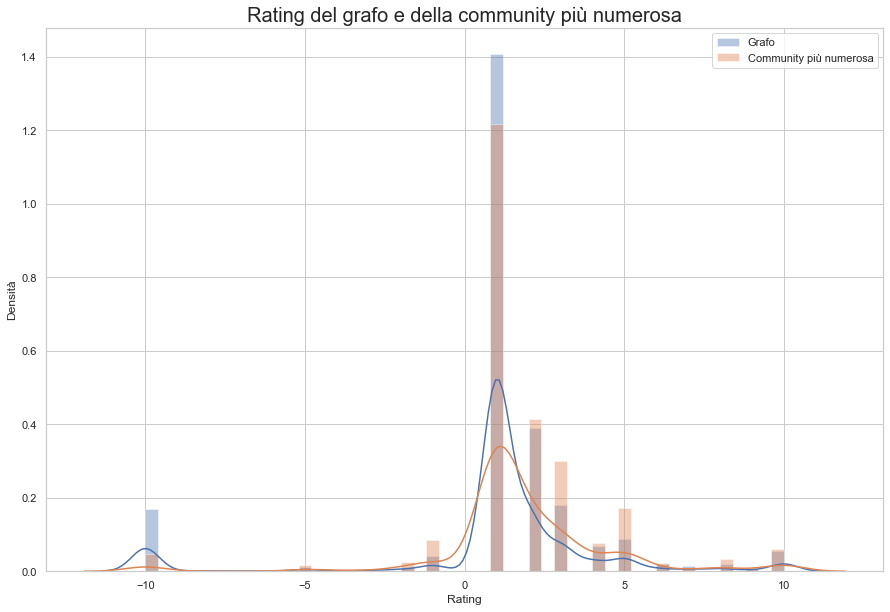

In [213]:
# Distplot ratings della community più numerosa
index_1 = dataset.index
dataframe_dict = {index_1[0]: dataset.iloc[0,2]}
for i in range (1,len(dataset)):
    dictionary_1 = {index_1[i]: dataset.iloc[i,2]}
    dataframe_dict.update(dictionary_1)
    
index_2 = dataframe_communities.index
dataframe_communities_dict = {index_2[0]: dataframe_communities.iloc[0,2]}
for i in range (1,len(dataframe_communities)):
    dictionary_2 = {index_2[i]: dataframe_communities.iloc[i,2]}
    dataframe_communities_dict.update(dictionary_2)

sns.set(style = 'whitegrid')

plt.figure(figsize=(15,10))
sns.distplot(list(dataframe_dict.values()), kde=True, label="Grafo")
sns.distplot(list(dataframe_communities_dict.values()), kde=True, label="Community più numerosa")
plt.title('Rating del grafo e della community più numerosa', fontsize = 20)
plt.xlabel('Rating')
plt.ylabel('Densità')
plt.legend(loc="upper right")
plt.show()

# Cricche
___

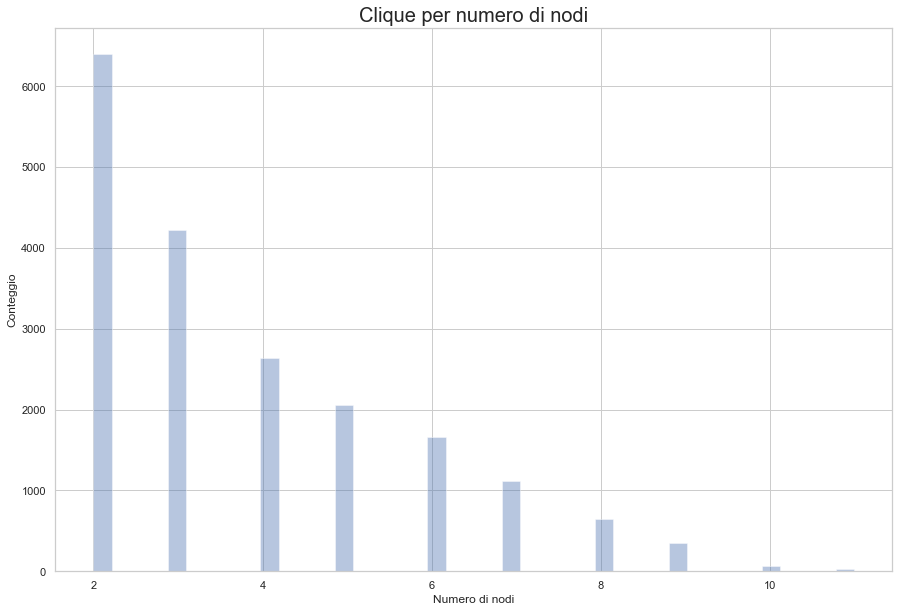

In [214]:
# Ricerca delle cricche e distplot delle cricche per numero di nodi
cliques = nx.find_cliques(S[0])
clique_elem = []
for clq in cliques:
    clique_elem.append(clq)
clique_elem.sort(key=len, reverse = True)

clique_dist = []
for i,cl in enumerate(clique_elem):
    clique_dist.append(len(clique_elem[i]))

sns.set(style = 'whitegrid')

plt.figure(figsize=(15,10))
sns.distplot(clique_dist, kde=False)
plt.title('Clique per numero di nodi', fontsize = 20)
plt.xlabel('Numero di nodi')
plt.ylabel('Conteggio')
plt.show()

In [215]:
# Dati della cricca più grande
data_cliques = []
for i in range(0,len(dataset)):
    if ((dataset.iloc[i,0] in clique_elem[0]) and (dataset.iloc[i,1] in clique_elem[0])):
        data_cliques.append(list(dataset.iloc[i,0:3]))
for i in range(0,len(data_cliques)):
    for j in range(0,len(data_cliques[0])):
        data_cliques[i][j] = int(data_cliques[i][j])
dataframe_cliques = pd.DataFrame.from_records(data_cliques)
dataframe_cliques.columns = ['SOURCE', 'TARGET', 'RATING']
dataframe_cliques.head(89)

,SOURCE,TARGET,RATING
0,545,1352,3
1,1352,545,5
2,1512,1352,5
3,3707,1735,2
4,1352,4860,3
...,...,...,...
84,1352,3640,3
85,1352,3707,4
86,1512,3640,3
87,1512,1735,2


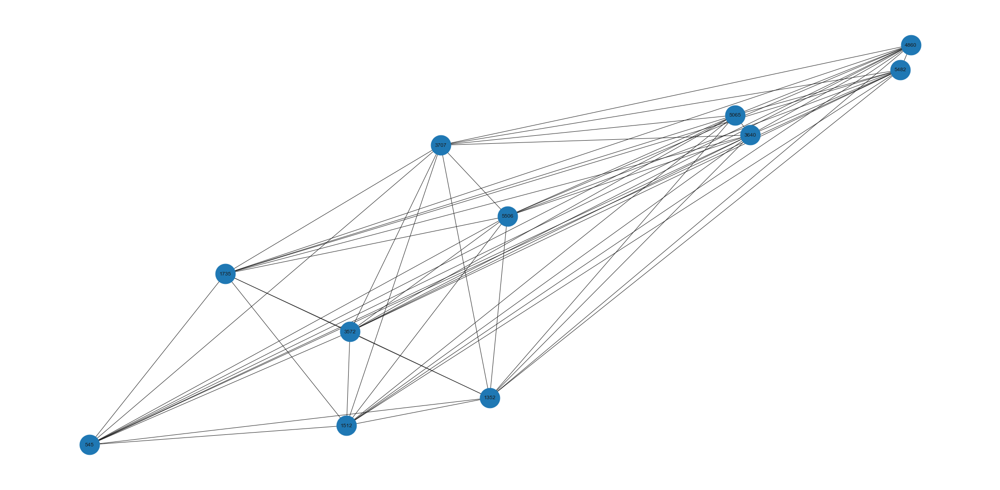

In [216]:
# Plot della cricca più grande con spring layout
cliques_edges = []
for i in range(0, len(dataframe_cliques)):
    cliques_edges.append((int(dataframe_cliques.iloc[i, 0]), int(dataframe_cliques.iloc[i, 1])))
cliques_graph = nx.Graph()
cliques_graph.add_edges_from(cliques_edges)
plt.figure(figsize=(40,20))
pos = nx.spring_layout(graph)
nx.draw_networkx(cliques_graph, pos, with_labels=True, node_size=2000)
plt.axis('off')
plt.show()

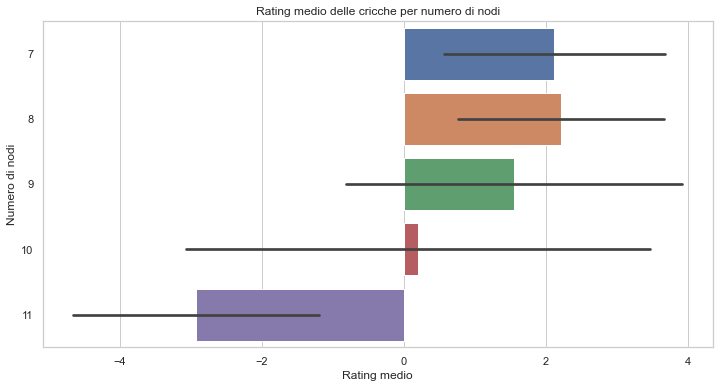

In [217]:
# Rating medio delle cricche (5 gruppi di cricche più grandi)
mean_values = []
nodes_number = []
for j in range (7, 12):
    clique_ratings = []
    for k in range(0,len(clique_elem)):
        if len(clique_elem[k]) == j:
            ratings = []
            for i in range(0,len(dataset)):
                if ((dataset.iloc[i,0] in clique_elem[k]) and (dataset.iloc[i,1] in clique_elem[k])):
                    ratings.append(int(dataset.iloc[i,2]))
            clique_ratings.append(ratings)
    mean_clique_ratings = clique_ratings
    for i in range(0, len(clique_ratings)):
        mean_clique_ratings[i] = statistics.mean(clique_ratings[i])    
    for z in range(0, len(mean_clique_ratings)):
        mean_values.append(mean_clique_ratings[z])
        nodes_number.append(j)
        
plt.figure(figsize=(12,6))
data_values = []
data_values.append(mean_values)
data_values.append(nodes_number)
dataframe_mean_clique_ratings = pd.DataFrame.from_records(data_values, index=["Values", "Nodes number"])
dataframe_mean_clique_ratings = dataframe_mean_clique_ratings.transpose()
dataframe_mean_clique_ratings["Nodes number"] = nodes_number
ax = sns.barplot(x="Values", y="Nodes number", data=dataframe_mean_clique_ratings, orient = "h", ci = "sd")
plt.xlabel("Rating medio")
plt.ylabel("Numero di nodi")
plt.title("Rating medio delle cricche per numero di nodi")
plt.show()